In [8]:
%conda install -y gdal geopandas

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: - 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - conda-forge/noarch::aioitertools==0.7.1=pyhd8ed1ab_0
  - conda-forge/noarch::typing-extensions==3.7.4.3=0
  - conda-forge/noarch::black==20.8b1=py_1
  - conda-forge/noarch::helpdev==0.7.1=pyhd8ed1ab_0
  - conda-forge/noarch::imageio==2.9.0=py_0
  - conda-forge/noarch::importlib_metadata==3.6.0=hd8ed1ab_0
  - conda-forge/linux-64::yarl==1.6.3=py36h8f6f2f9_1
  - conda-forge/noarch::flake8==3.8.4=py_0
  - conda-forge/noarch::jsonschema==3.2.0=py_2
  - conda-forge/linux-64::matplotlib-base==3.3.4=py36hd391965_0
  - conda-forge/linux-64::path==15.1.2=py36h5fab9bb_0
  - conda-forge/linux-64::pluggy==0.13.1=py36h5fab9bb_4
  - conda-forge/noarch::qdar

In [19]:
%pip install 'h5py==2.10.0' --force-reinstall

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
     |████████████████████████████████| 2.9 MB 27.0 MB/s            
     |████████████████████████████████| 14.8 MB 115.3 MB/s            
  Attempting uninstall: six
    Found existing installation: six 1.15.0
    Uninstalling six-1.15.0:
      Successfully uninstalled six-1.15.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.3.4 requires numpy<1.19.0,>=1.16.0, but you have numpy 1.19.5 which is incompatible.
awscli 1.24.10 requires colorama<0.4.5,>=0.2.5, but you have colo

In [99]:
import boto3
import os
import numpy as np
import uuid
import cv2 as cv
from PIL import Image
from matplotlib import pyplot as plt
# from tensorflow.keras.models import model_from_json
from tensorflow.keras.models import load_model, model_from_json
from io import BytesIO
import zipfile

In [100]:
# Set Variables
s3_resource = boto3.resource('s3')
output_bucket = "csu-team04-inference-output"
input_bucket = "csu-team04-inference-input"
model_bucket_name = "csu-team04-inference-model"
#img_object_name = "output_149.tiff"
# model_object_name = "new_model.h5"
model_object_name = "model.tar.gz"

/home/ec2-user/anaconda3/envs/amazonei_tensorflow2_p36/lib/python3.6/site-packages/boto3/compat.py:88: PythonDeprecationWarning: Boto3 will no longer support Python 3.6 starting May 30, 2022. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.7 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)


In [101]:
def load_model(json_file, weights_file):
    with open(json_file, 'r') as file:
        json_content = file.read()
        
    model = model_from_json(json_content)
    model.load_weights(weights_file)
    
    return model

In [102]:
# Load Model
import tarfile
import os
print("Loading model...")
model_path = f"/tmp/{model_object_name}"
s3.download_file(model_bucket_name, model_object_name, model_path)
model_file = tarfile.open(model_path)
model_file.extractall("/tmp/extracted_model")
print(os.listdir("/tmp/extracted_model/"))
model = load_model("/tmp/extracted_model/model.json", "/tmp/extracted_model/model.h5")
# model = load_model("/tmp/new_model.h5", compile=False)
print("Model loaded successfully!")

Loading model...
['model.h5', 'model.json']
Model loaded successfully!


In [103]:
# Overlay Mask on Image
colour = [66, 255, 73]
colour = [i/255.0 for i in colour]

def place_mask_on_image(image, mask):
    np.place(image[:, :, :], mask[:, :, :] >= 0.5, colour)
    return image

In [104]:
def predict(prediction):
    prediction = prediction[0][:, :, :]
    prediction = np.repeat(prediction, 3, 2)
    return prediction

Formatting image...


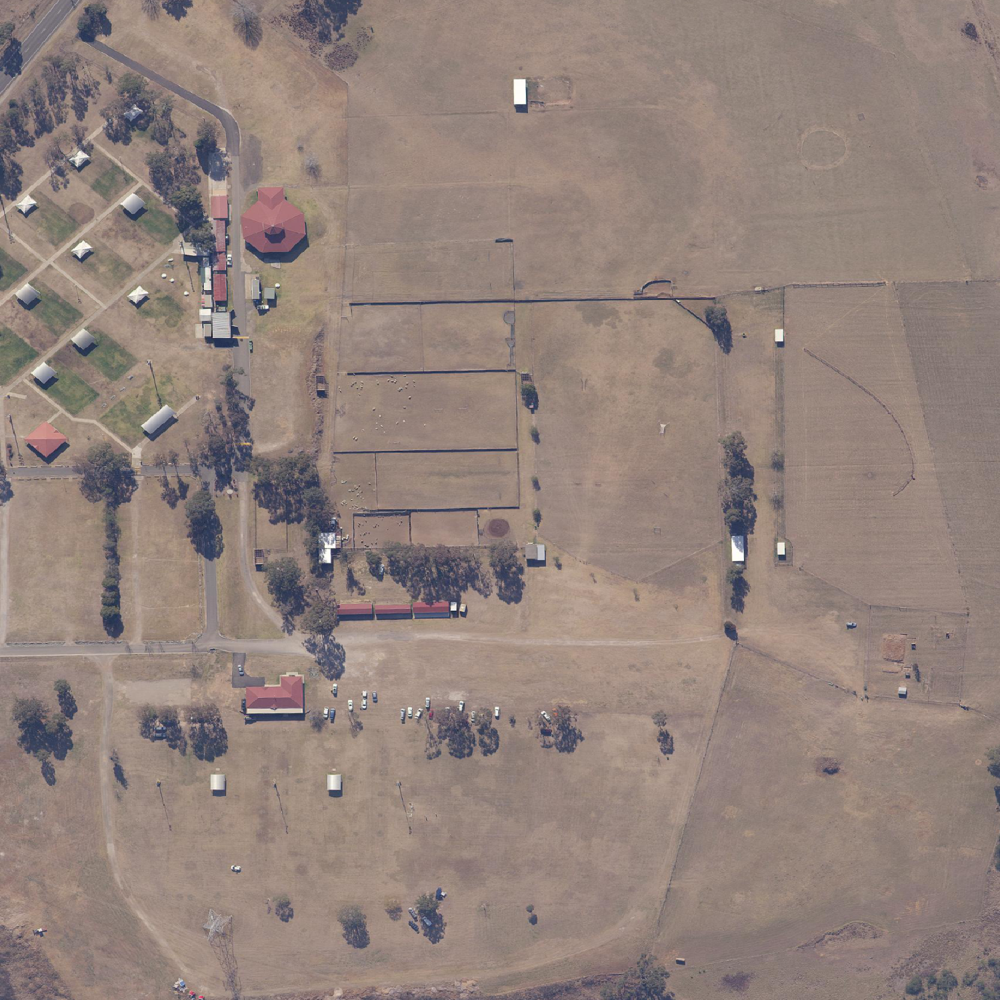

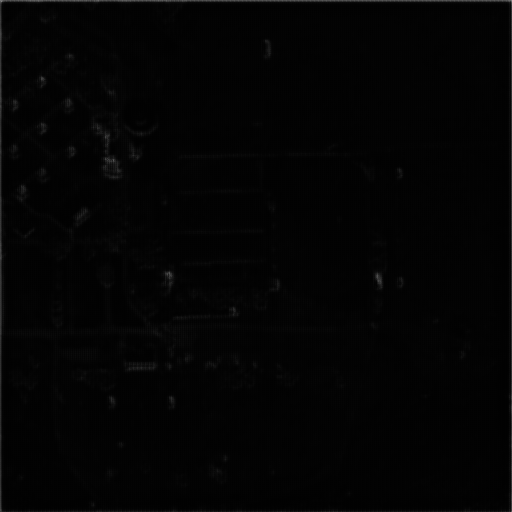

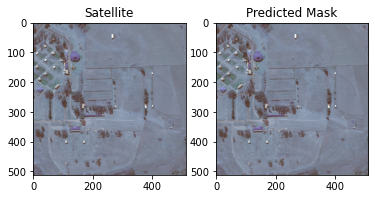

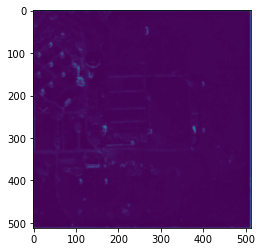

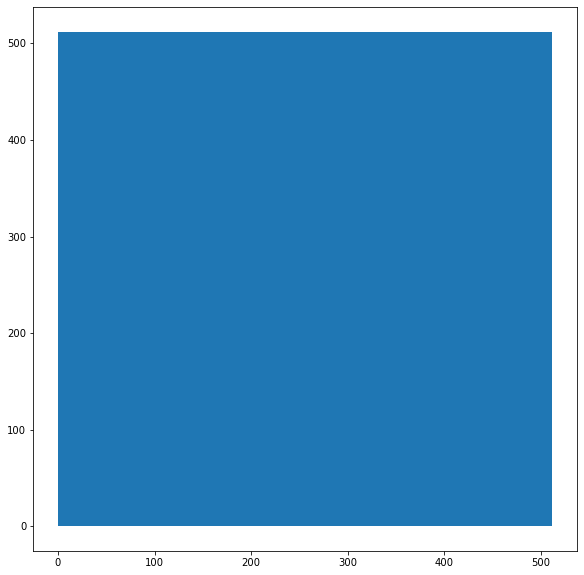

Uploaded image to bucket!


/home/ec2-user/anaconda3/envs/amazonei_tensorflow2_p36/lib/python3.6/site-packages/boto3/compat.py:88: PythonDeprecationWarning: Boto3 will no longer support Python 3.6 starting May 30, 2022. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.7 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)


Formatting image...


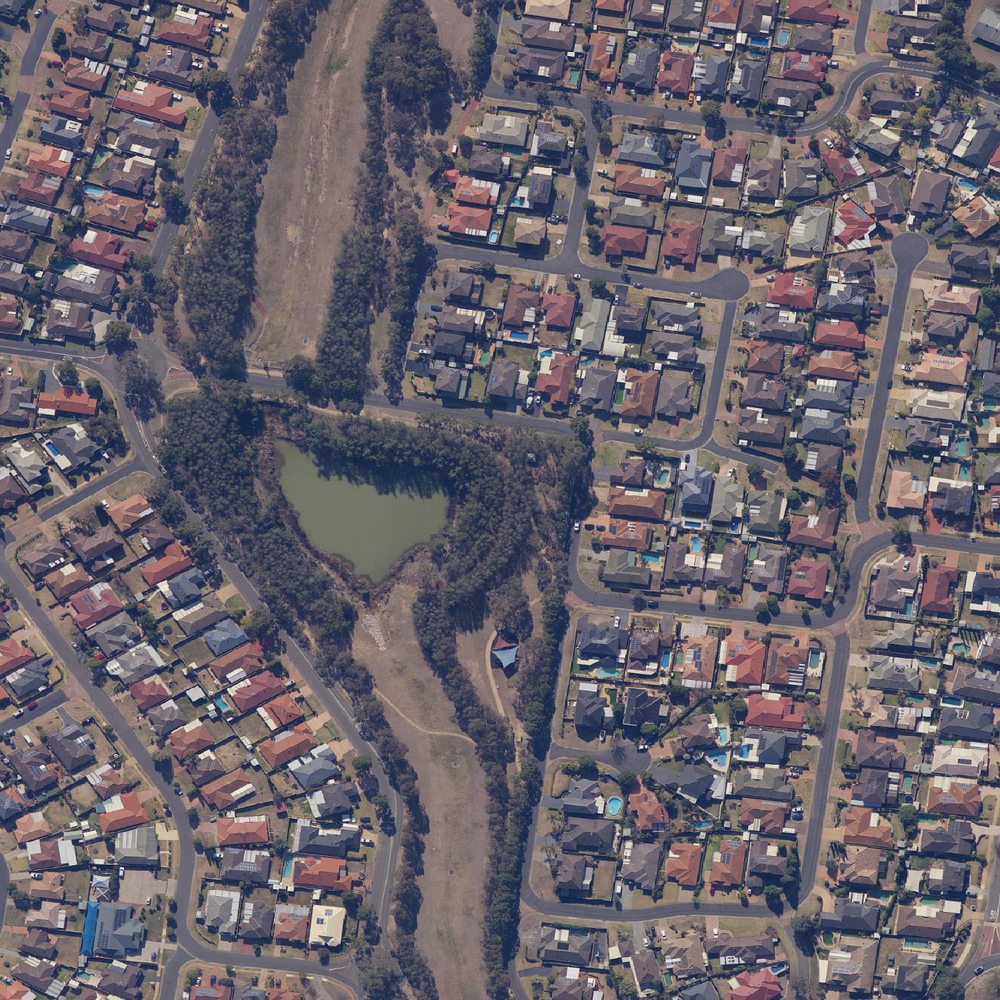

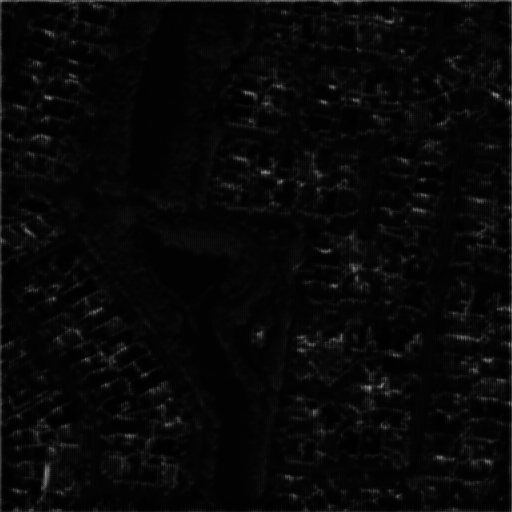

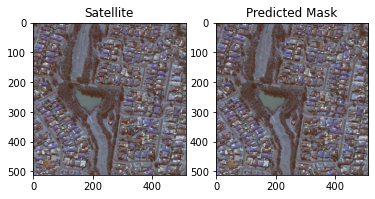

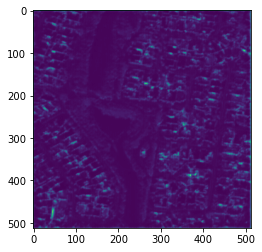

KeyboardInterrupt: 

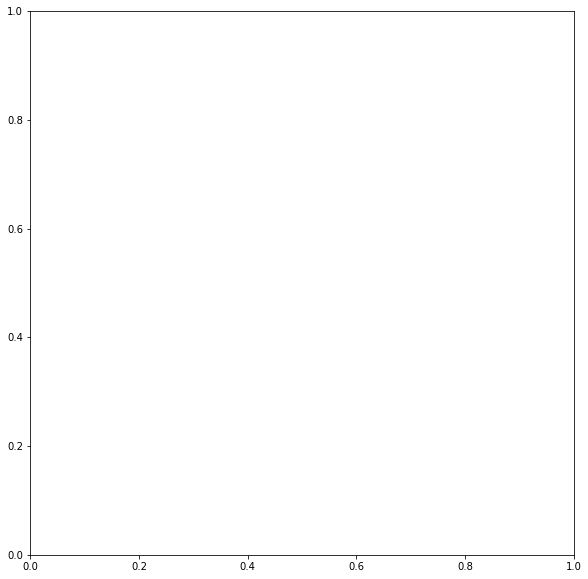

In [118]:
from osgeo import gdal, ogr, osr
import geopandas as gpd
    
for obj in s3_resource.Bucket(input_bucket).objects.all():
    img_object_name=(obj.key)
  # Get Image From Bucket
    img_file_path = f"/tmp/{uuid.uuid4()}-{img_object_name}"

    s3 = boto3.client("s3")
    s3.download_file(input_bucket, img_object_name, img_file_path)
    image = cv.imread(img_file_path)
    
        # Get Image As Numpy Array
    print("Formatting image...")
    img_shape = (512, 512)
    image = image[:,:,:3]
    image = np.expand_dims(cv.resize(image, img_shape), 0)
    image = (image/255.0)
    image = image.astype(np.float32)
    display(Image.open(img_file_path))
    
    # Make Prediction
    prediction = predict(model(image))
    # Convert Results to Tiff
    upload_path = f"/tmp/{img_object_name}"
    result_image = Image.fromarray((prediction * 255).astype(np.uint8))
    result_image.save(upload_path)
    display(Image.open(upload_path))
    
    # Display Overlay
    plt.subplot(1, 2, 1)
    plt.title("Satellite")
    plt.imshow(image[0])
    plt.subplot(1, 2, 2)
    plt.title("Predicted Mask")
    prediction = place_mask_on_image(image[0], prediction)
    plt.imshow(prediction)
    plt.show()
    
   
    raster = gdal.Open(upload_path)
    geo_transform = raster.GetGeoTransform()
    projection = raster.GetProjection()
    raster_band = raster.GetRasterBand(1)
    arr = raster_band.ReadAsArray()

    shape_projection = osr.SpatialReference()
    shape_projection.ImportFromWkt(projection)

    plt.figure()
    plt.imshow(arr)
    plt.show()
    
    output_file = "./output_shapefile.shp"
    shapefile_driver = ogr.GetDriverByName("ESRI Shapefile")
    output_shapefile = shapefile_driver.CreateDataSource(output_file)
    shape_layer = output_shapefile.CreateLayer('layername', srs=shape_projection)

    new_field = ogr.FieldDefn(str("ID"), ogr.OFTInteger)
    shape_layer.CreateField(new_field)
    gdal.Polygonize(raster_band, None, shape_layer, 0, [], callback=None)
    output_shapefile.Destroy()
    raster_band = None
    
    shapefile = gpd.read_file("./output_shapefile.shp")
    fix, ax = plt.subplots(figsize=(10, 10))

    shapefile.plot(ax=ax)
    plt.show()
    
    # Upload Result to Bucket
    s3.upload_file(upload_path, output_bucket, f"{img_object_name.split('.')[0]}-mask.tiff")
    print("Uploaded image to bucket!")
    s3.delete_object(Bucket=input_bucket, Key=obj.key)